# Customer Churn Analytics:
## **Ecommerce Customer Churn Prediction using Meachine Learning**
### Created By : Javier Jayastu Budiarto

## Business Problem Understanding

**Context**  
2022 ini sudah banyak ecommerce yang mulai bekembang di Indonesia, dengan banyaknya persaingan antar ecommerce, perusahaan ingin mengevaluasi *strategic planing* berdasarkan dari tingkat kepuasan pelanggan dengan memperhatikan *customer churn*. Perusahaan ingin mengetahui dan mengantisipasi customer akan berhenti menggunakan eccomerce perusahaan dan berpindah ke ecommerce lain, karena bisnis akan rugi besar jika kehilangan pelanggan. Jadi, diperlukan strategi untuk menghentikan customer churn atau kehilangan pelanggan dan meretensi pelanggan yang sudah dimiliki, karena merekalah sumber utama revenue bisnis

Churn :

0 : Tidak berhenti menggunakan layanan ecommerce

1 : Berhenti menggunakan layanan ecommerce

Source : https://blog.usetada.com/id/apa-itu-customer-churn-dan-bagaimana-menghentikannya

**Problem Statement :**

Kehilangan pelanggan bisa memakan banyak kerugian karena pada faktanya mendapat pelanggan baru 5 kali lebih mahal daripada mempertahankan pelanggan yang sudah ada, dan membuat pelanggan baru menjadi loyal juga 16 kali lebih mahal. Perusahaan ingin meningkatkan ketepatan sasaran pemberian layanan sehingga customer tetap bertahan menggunakan layanan ecommerce dan menambah customer baru yang menggunakan ecommerce kita ini.


**Goals :**

Maka berdasarkan permasalahan tersebut, perusahaan ingin memiliki kemampuan untuk memprediksi kemungkinan seorang customer masih menggunakan layanan ecommerce kita atau tidak, sehingga dapat meminimalisir kehilangan pelanggan dan kesalahan sasaran pemberian treatment sehingga dapat mengurangi kerugian perusahaan.

Dan juga, perusahaan ingin mengetahui apa/faktor/variabel apa yang membuat seorang customer tetap mau menggunakan layanan kita atau tidak, sehingga dapat membuat rencana yang lebih baik dalam memberikan layanan yang memuaskan dan tepat sasaran untuk customer.


**Analytic Approach :**

Jadi yang akan kita lakukan adalah menganalisis data untuk menemukan pola yang membedakan customer yang tidak berhenti menggunakan layanan ecommerce ini dan yang berhenti.

Kemudian kita akan membangun model klasifikasi yang akan membantu perusahaan untuk dapat memprediksi probabilitas seorang customer ingin menggunakan layanan ecommerce kita atau tidak. 

### **Metric Evaluation**

### Attribute Information

| Attribute | Data Type, Length | Description |
| --- | --- | --- |
| Tenure | Float | Tenure of customer in organization |
| WarehouseToHome | Float | Distance in between warehouse to home of customer |
| NumberOfDeviceRegistered | Long | Number of devices is registered  |
| PreferedOrderCat | Text | Preferred order category of customer in last month |
| SatisfactionScore | Long | Satisfactory score of customer on service |
| MaritalStatus | Text | Marital status of customer |
| NumberOfAddress | Long | Number of address of customere |
| Complain | Long | 0 - Don't complain, 1 - Complain |
| DaySinceLastOrder | Float | Day Since last order by customer |
| CashbackAmount | Float | Average cashback in last month |
| Churn | Long | 0 - don't stop using e-commerce services, 1 - stop using e-commerce services |

![img src](https://static.wixstatic.com/media/02a1ae_32cad84eaf3348059a8996d1b0f88627~mv2.jpg/v1/fill/w_597,h_416,al_c,q_90/02a1ae_32cad84eaf3348059a8996d1b0f88627~mv2.jpg)

Type 1 error : **False Positive**  
Konsekuensi: Kurang tepatnya pemberian diskon,fitur khusus customer pengguna yang menyebabkan cost terbuang sia sia

Type 2 error : **False Negative**  
Konsekuensi: Kehilangan customer yang menyebabkan kerugian pada perusahaan, dan memerlukan tambahan pengeluaran yang banyak untuk mendapatkan customer baru seperti biaya diskon pelanggan baru, iklan, dll.  

Berdasarkan konsekuensinya, maka sebisa mungkin yang akan kita lakukan adalah membuat model yang dapat mengurangi kehilangan pelanggan tersebut, tetapi tetap dengan meperhatikan ketepatan sasaran pemberian diskon untuk customer pengguna layanan ecommerce. Jadi harus kita seimbangkan nanti antara precision dan recallnya dari kelas positive.

In [1]:
# Library

import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno
from IPython.display import display

# Feature Engineering
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, OrdinalEncoder, RobustScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer
import category_encoders as ce

# Model Selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV,StratifiedKFold,train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
from sklearn.metrics import roc_curve, roc_auc_score, plot_roc_curve

# Imbalance Dataset
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

# Ignore Warning
import sys
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")

# Set max columns
pd.set_option('display.max_columns', None)

In [2]:
# Load Dataset
df = pd.read_csv('data_ecommerce_customer_churn.csv')
df.head()

,Tenure,WarehouseToHome,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,DaySinceLastOrder,CashbackAmount,Churn
0,15.0,29.0,4,Laptop & Accessory,3,Single,2,0,7.0,143.32,0
1,7.0,25.0,4,Mobile,1,Married,2,0,7.0,129.29,0
2,27.0,13.0,3,Laptop & Accessory,1,Married,5,0,7.0,168.54,0
3,20.0,25.0,4,Fashion,3,Divorced,7,0,NaN,230.27,0
4,30.0,15.0,4,Others,4,Single,8,0,8.0,322.17,0


In [3]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3941 entries, 0 to 3940
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Tenure                    3747 non-null   float64
 1   WarehouseToHome           3772 non-null   float64
 2   NumberOfDeviceRegistered  3941 non-null   int64  
 3   PreferedOrderCat          3941 non-null   object 
 4   SatisfactionScore         3941 non-null   int64  
 5   MaritalStatus             3941 non-null   object 
 6   NumberOfAddress           3941 non-null   int64  
 7   Complain                  3941 non-null   int64  
 8   DaySinceLastOrder         3728 non-null   float64
 9   CashbackAmount            3941 non-null   float64
 10  Churn                     3941 non-null   int64  
dtypes: float64(4), int64(5), object(2)
memory usage: 338.8+ KB


In [4]:
df.describe()

,Tenure,WarehouseToHome,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,DaySinceLastOrder,CashbackAmount,Churn
count,3747.000000,3772.000000,3941.000000,3941.000000,3941.000000,3941.000000,3728.000000,3941.000000,3941.000000
mean,10.081398,15.650583,3.679269,3.088302,4.237757,0.282416,4.531652,176.707419,0.171023
std,8.498864,8.452301,1.013938,1.381832,2.626699,0.450232,3.667648,48.791784,0.376576
min,0.000000,5.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,9.000000,3.000000,2.000000,2.000000,0.000000,2.000000,145.700000,0.000000
50%,9.000000,14.000000,4.000000,3.000000,3.000000,0.000000,3.000000,163.340000,0.000000
75%,16.000000,21.000000,4.000000,4.000000,6.000000,1.000000,7.000000,195.250000,0.000000
max,61.000000,127.000000,6.000000,5.000000,22.000000,1.000000,46.000000,324.990000,1.000000


In [5]:
dataDesc = []
for i in df.columns:
    dataDesc.append([
        i,
        df[i].dtypes,
        df[i].isna().sum(),
        round(((df[i].isna().sum() / len(df)) * 100), 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(dataDesc, columns=[
    "Data Features",
    "Data Types",
    "Null",
    "Null Percentage",
    "Unique",
    "Unique Sample"
])

,Data Features,Data Types,Null,Null Percentage,Unique,Unique Sample
0,Tenure,float64,194,4.92,36,"[61.0, 8.0]"
1,WarehouseToHome,float64,169,4.29,33,"[33.0, 7.0]"
2,NumberOfDeviceRegistered,int64,0,0.00,6,"[6, 2]"
3,PreferedOrderCat,object,0,0.00,6,"[Fashion, Laptop & Accessory]"
4,SatisfactionScore,int64,0,0.00,5,"[4, 1]"
5,MaritalStatus,object,0,0.00,3,"[Divorced, Married]"
6,NumberOfAddress,int64,0,0.00,14,"[6, 10]"
7,Complain,int64,0,0.00,2,"[1, 0]"
8,DaySinceLastOrder,float64,213,5.40,22,"[10.0, 12.0]"
9,CashbackAmount,float64,0,0.00,2335,"[235.91000000000005, 161.25]"


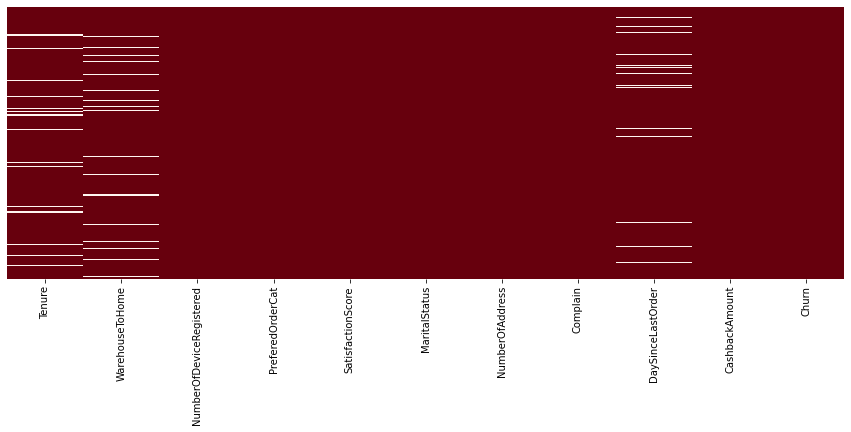

In [6]:
## Cek Missing Value
plt.figure(figsize = (15, 5))
sns.heatmap(df.isna(), cmap = 'Reds_r',yticklabels = False, cbar= False)
plt.show()

In [7]:
df.isna().sum()

Tenure                      194
WarehouseToHome             169
NumberOfDeviceRegistered      0
PreferedOrderCat              0
SatisfactionScore             0
MaritalStatus                 0
NumberOfAddress               0
Complain                      0
DaySinceLastOrder           213
CashbackAmount                0
Churn                         0
dtype: int64

In [8]:
df['Churn'].value_counts()/len(df['Churn']) * 100

0    82.897742
1    17.102258
Name: Churn, dtype: float64

In [9]:
df.dropna()['Churn'].value_counts()/len(df['Churn']) * 100

0    72.443542
1    12.940878
Name: Churn, dtype: float64

Karena target ingin memprediksi pengurangan Churn dan presentase Churn apabila missing value dihapus tidak berbeda jauh sehingga tidak masalah untuk baris yang terdapat missing value dihapus.

In [10]:
df.dropna(inplace=True)

In [11]:
df.isna().sum()

Tenure                      0
WarehouseToHome             0
NumberOfDeviceRegistered    0
PreferedOrderCat            0
SatisfactionScore           0
MaritalStatus               0
NumberOfAddress             0
Complain                    0
DaySinceLastOrder           0
CashbackAmount              0
Churn                       0
dtype: int64

### Mengechek Data Apakah ada data yang Salah

In [13]:
dataCol = []
for i in df.columns:
    dataCol.append([
        i,
        df[i].unique(),
    ])

pd.DataFrame(dataCol, columns=[
    "Data Features",
    "Unique",
])

,Data Features,Unique
0,Tenure,"[15.0, 7.0, 27.0, 30.0, 1.0, 11.0, 17.0, 16.0,..."
1,WarehouseToHome,"[29.0, 25.0, 13.0, 15.0, 16.0, 11.0, 12.0, 7.0..."
2,NumberOfDeviceRegistered,"[4, 3, 6, 2, 1, 5]"
3,PreferedOrderCat,"[Laptop & Accessory, Mobile, Others, Mobile Ph..."
4,SatisfactionScore,"[3, 1, 4, 2, 5]"
5,MaritalStatus,"[Single, Married, Divorced]"
6,NumberOfAddress,"[2, 5, 8, 3, 7, 9, 10, 1, 11, 4, 6, 22, 21]"
7,Complain,"[0, 1]"
8,DaySinceLastOrder,"[7.0, 8.0, 11.0, 2.0, 1.0, 4.0, 3.0, 6.0, 0.0,..."
9,CashbackAmount,"[143.32, 129.29, 168.54, 322.17, 152.81, 149.5..."


Tidak ditemukan data yang salah di setiap Features nya

Selanjutnya kita akan menghapus kolom yang tidak digunakan yaitu NumberOfAddress, karena ini hanyalah nomer alamat rumah customer,sehingga tidak ada hubungan untuk analisa yang akan kita lakukan dan juga tidak berguna dalam pembuatan model machine learning nantinya.

In [14]:
df.drop(columns='NumberOfAddress', inplace = True)

## Recheck Dataset

In [15]:
df.describe()

,Tenure,WarehouseToHome,NumberOfDeviceRegistered,SatisfactionScore,Complain,DaySinceLastOrder,CashbackAmount,Churn
count,3365.000000,3365.000000,3365.000000,3365.000000,3365.000000,3365.000000,3365.000000,3365.000000
mean,10.177712,15.713819,3.698960,3.094205,0.283507,4.780089,179.774725,0.151560
std,8.512943,8.513705,1.024092,1.381156,0.450767,3.685837,48.293472,0.358647
min,0.000000,5.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,9.000000,3.000000,2.000000,0.000000,2.000000,148.420000,0.000000
50%,9.000000,14.000000,4.000000,3.000000,0.000000,4.000000,165.140000,0.000000
75%,16.000000,21.000000,4.000000,4.000000,1.000000,8.000000,191.740000,0.000000
max,61.000000,127.000000,6.000000,5.000000,1.000000,46.000000,324.990000,1.000000


In [16]:
df.describe(include=['O'])

,PreferedOrderCat,MaritalStatus
count,3365,3365
unique,6,3
top,Laptop & Accessory,Married
freq,1408,1767


In [17]:
dataDesc = []
for i in df.columns:
    dataDesc.append([
        i,
        df[i].dtypes,
        df[i].isna().sum(),
        round(((df[i].isna().sum() / len(df)) * 100), 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(dataDesc, columns=[
    "Data Features",
    "Data Types",
    "Null",
    "Null Percentage",
    "Unique",
    "Unique Sample"
])

,Data Features,Data Types,Null,Null Percentage,Unique,Unique Sample
0,Tenure,float64,0,0.0,36,"[28.0, 24.0]"
1,WarehouseToHome,float64,0,0.0,33,"[11.0, 23.0]"
2,NumberOfDeviceRegistered,int64,0,0.0,6,"[6, 3]"
3,PreferedOrderCat,object,0,0.0,6,"[Laptop & Accessory, Fashion]"
4,SatisfactionScore,int64,0,0.0,5,"[3, 4]"
5,MaritalStatus,object,0,0.0,3,"[Divorced, Single]"
6,Complain,int64,0,0.0,2,"[1, 0]"
7,DaySinceLastOrder,float64,0,0.0,22,"[6.0, 13.0]"
8,CashbackAmount,float64,0,0.0,2002,"[316.44, 231.91000000000005]"
9,Churn,int64,0,0.0,2,"[0, 1]"


## Data Analisis

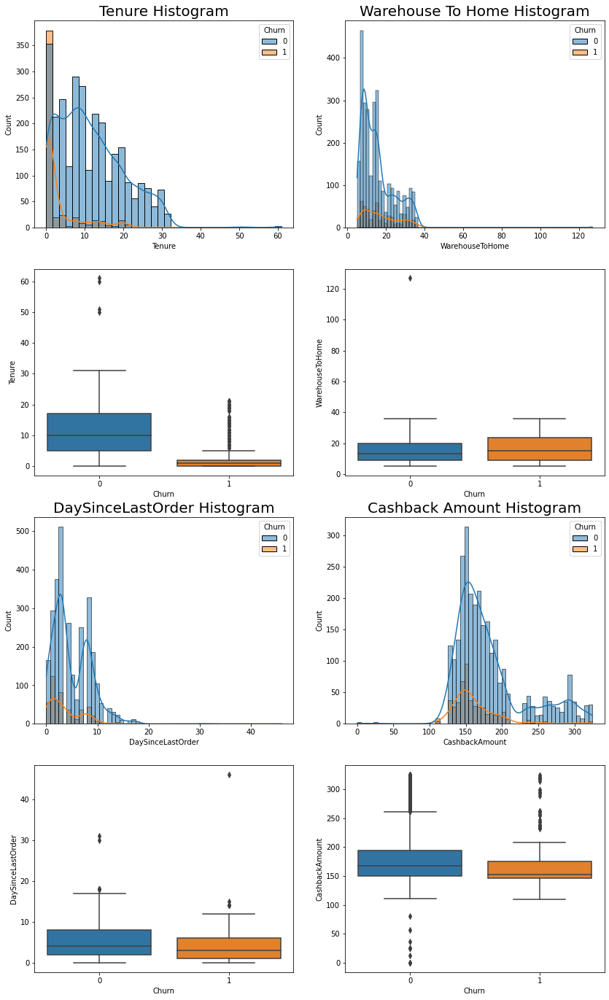

In [18]:
plt.figure(figsize=(14,24))

plt.subplot(421)
sns.histplot(data=df,x='Tenure',hue='Churn',kde=True)
plt.title('Tenure Histogram',fontsize=20)

plt.subplot(422)
sns.histplot(data=df,x='WarehouseToHome',hue='Churn',kde=True)
plt.title('Warehouse To Home Histogram',fontsize=20)

plt.subplot(423)
sns.boxplot(data=df,y='Tenure', x='Churn')

plt.subplot(424)
sns.boxplot(data=df,y='WarehouseToHome', x='Churn')

plt.subplot(425)
sns.histplot(data=df,x='DaySinceLastOrder',hue='Churn',kde=True)
plt.title('DaySinceLastOrder Histogram',fontsize=20)

plt.subplot(426)
sns.histplot(data=df,x='CashbackAmount',hue='Churn',kde=True)
plt.title('Cashback Amount Histogram',fontsize=20)

plt.subplot(427)
sns.boxplot(data=df,y='DaySinceLastOrder', x='Churn')

plt.subplot(428)
sns.boxplot(data=df,y='CashbackAmount', x='Churn')
plt.show()

Berdasarkan histogram dan boxplot diatas, kita dapat menyimpulkan bahwa:
1. Terlihat perbedaan distribusi `Tenure` dari target yang 0 (tidak Churn) dan target yang 1 (yang Churn), sehingga pengguna baru (Tenure rendah) lebih mungkin untuk Churn.

2. Distribusi `WarehouseToHome` kurang lebih sama antara target 0 dan 1. Dimana berarti kemungkinan `WarehouseToHome`ini tidak mempengaruhi seorang Churn dan tidak.

3. Distribusi `DaySinceLastOrder` kurang lebih sama antara target 0 dan 1. Dimana berarti kemungkinan `DaySinceLastOrder`ini tidak mempengaruhi seorang kandidat jadi tertarik dan tidaknya.

4. Distribusi `CashbackAmount` kurang lebih sama antara target 0 dan 1. Dimana pengguna yang mendapatkan total Cashback dari range 150 - 200 lebih mungkin Churn. 



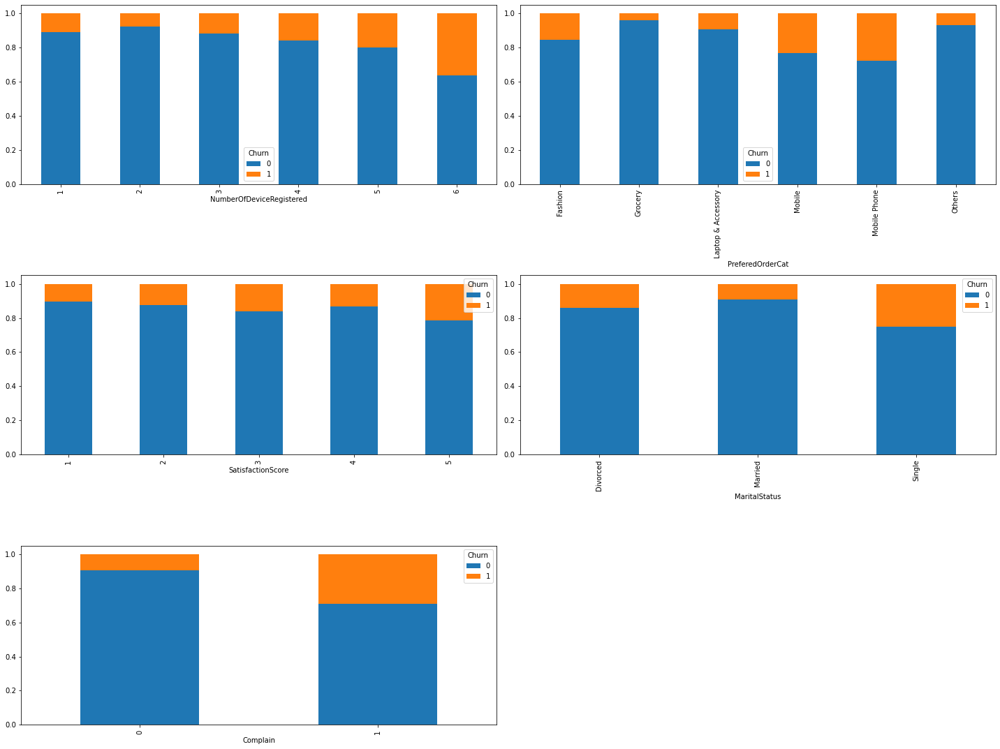

In [19]:
count = 0
fig = plt.figure(figsize=(20,20))

for i in df.drop(columns=['Churn','Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']).columns:
    count +=1
    ax= plt.subplot(4,2,count)
    pd.crosstab(df[i],df['Churn'],normalize=0).plot(kind='bar',stacked=True,ax=ax)
    fig.tight_layout()

plt.show()



In [20]:
for i in df.drop(columns=['Churn','Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']).columns:
    Complain_df = df.groupby(i)['Churn'].value_counts(normalize=True).unstack()
    display(Complain_df.sort_values(by=[1.0], ascending=False))

Churn,0,1
NumberOfDeviceRegistered,,
6,0.639175,0.360825
5,0.800000,0.200000
4,0.842674,0.157326
3,0.884778,0.115222
1,0.892086,0.107914
2,0.923077,0.076923


Churn,0,1
PreferedOrderCat,,
Mobile Phone,0.724178,0.275822
Mobile,0.768293,0.231707
Fashion,0.847255,0.152745
Laptop & Accessory,0.906250,0.093750
Others,0.932961,0.067039
Grocery,0.961686,0.038314


Churn,0,1
SatisfactionScore,,
5,0.786026,0.213974
3,0.837073,0.162927
4,0.866980,0.133020
2,0.876506,0.123494
1,0.897361,0.102639


Churn,0,1
MaritalStatus,,
Single,0.750000,0.250000
Divorced,0.861224,0.138776
Married,0.906621,0.093379


Churn,0,1
Complain,,
1,0.708595,0.291405
0,0.903774,0.096226


Berdasarkan barplot dan table diatas kita dapat menyimpulkan beberapa hal :
1. Pengguna dengan `NumberOfDeviceRegistered`nya `6` lebih mungkin Churn dibandingkan `NumberOfDeviceRegistered` yang lain.
2. Pengguna dengan `PreferedOrderCat`nya `Mobile Phone` lebih mungkin Churn dibandingkan `PreferedOrderCat` yang lain.
3. Pengguna dengan `SatisfactionScore`nya `5` lebih mungkin Churn dibandingkan `SatisfactionScore` yang lain.
4. Pengguna yang `MaritalStatus`nya `Single` lebih mungkin Churn dibandingkan `MaritalStatus` yang lain
5. Pengguna yang `Complain` lebih mungkin Churn dibandingkan yang tidak complain.

## Data Preparation

In [21]:
## Cek Imbalanced Data
pd.crosstab(index=df['Churn'], columns='count', normalize = True)*100

col_0,count
Churn,
0,84.843982
1,15.156018


Sekarang kita akan merubah fitur/kolom `PreferedOrderCat` dan `MaritalStatus` menggunakan One Hot Encoding, karena fitur ini tidak memiliki urutan/tidak ordinal, dan juga jumlah unique datanya hanya sedikit.

In [22]:
transformer = ColumnTransformer([
    ('onehot', OneHotEncoder(drop='first'), ['PreferedOrderCat','MaritalStatus'])
], remainder='passthrough')

In [23]:
x = df.drop(columns=['Churn'])
y = df['Churn']

In [24]:
# Splitting Data
x_train,x_test,y_train,y_test=train_test_split(x,y,stratify=y,test_size=0.2,random_state=42)

In [25]:
testing = pd.DataFrame(transformer.fit_transform(x_train),columns=transformer.get_feature_names())
testing.head()

,onehot__x0_Grocery,onehot__x0_Laptop & Accessory,onehot__x0_Mobile,onehot__x0_Mobile Phone,onehot__x0_Others,onehot__x1_Married,onehot__x1_Single,Tenure,WarehouseToHome,NumberOfDeviceRegistered,SatisfactionScore,Complain,DaySinceLastOrder,CashbackAmount
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,25.0,2.0,5.0,0.0,11.0,177.08
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,16.0,4.0,5.0,0.0,1.0,150.52
2,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.0,14.0,4.0,3.0,0.0,1.0,137.74
3,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,23.0,4.0,3.0,0.0,2.0,143.77
4,0.0,0.0,0.0,0.0,1.0,1.0,0.0,20.0,7.0,4.0,2.0,0.0,3.0,321.27


## Modeling & Evaluation

In [26]:
logreg = LogisticRegression()
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
xgb = XGBClassifier()

Disini saya menggunakan beberapa model yaitu:
1. Logisctic Regression: sebuah algoritma klasifikasi untuk mencari hubungan antara fitur (input) diskrit/kontinu dengan probabilitas hasil output diskrit tertentu.
2. KNN :Teknik ini bekerja dengan memberikan hasil prediksi berdasarkan kelas mayoritas dari beberapa pengamatan yang serupa atau tetangga terdekat.
3. Decision Tree: model prediksi menggunakan struktur pohon atau struktur berhirarki yang mengarah ke suatu keputusan.
4. Random Forest : hasil modifikasi dari metode bagging. Jika dilihat dari tujuannya, random forest juga memiliki tujuan untuk memperkecil ragam nilai prediksi dan membuat hasil prediksi menjadi lebih stabil.Dengan Random forest kita memilih secara acak kandidat fitur yang akan digunakan dalam setiap splitting tree.
5. XG Boost: implementasi lanjutan dari algoritma peningkatan gradien(Gradient Boosting). XGboost menggunakan prinsip ensemble yaitu menggabungkan beberapa set pembelajar (tree) yang lemah menjadi sebuah model yang kuat sehinga menghasilkan prediksi yang kuat. 

### Model Benchmarking : K-Fold

In [27]:
models = [logreg,knn,dt,rf,xgb]
score=[]
rata=[]
std=[]

for i in models:
    skfold=StratifiedKFold(n_splits=5)
    estimator=Pipeline([
        ('preprocess',transformer),
        ('model',i)])
    model_cv=cross_val_score(estimator,x_train,y_train,cv=skfold,scoring='roc_auc')
    score.append(model_cv)
    rata.append(model_cv.mean())
    std.append(model_cv.std())
    
pd.DataFrame({'model':['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'XGBoost'],'mean roc_auc':rata,'sdev':std}).set_index('model').sort_values(by='mean roc_auc',ascending=False)

,mean roc_auc,sdev
model,,
Random Forest,0.960111,0.006777
XGBoost,0.958843,0.009449
Logistic Regression,0.882093,0.013793
Decision Tree,0.846691,0.017578
KNN,0.836322,0.031287


Terlihat bahwa model Random Forest adalah yang terbaik untuk roc_aucnya dari setiap model yang menggunakan default hyperparameter

ROC(Receiver Operating Characterictic)
=> Menampilkan Seberapa bagus Model dapat memisahkan data

=> Optimal digunakan untuk binary classification - Tidak efektif untuk multiclass

=> Untuk melihat threshold terbaik


=> Terbentuk dari titik-titik threshold

=> Range Threshold => 0 - 1


AUC => Area Under Curve => "Luas" area dibawah ROC Curve

- Range => 0 - 1
- Semakin mendekati 1 semakin bagus

### Model Benchmarking : Test Data

In [28]:
models = [logreg,knn,dt,rf,xgb]
score_roc_auc = []

def y_pred_func(i):
    estimator=Pipeline([
        ('preprocess',transformer),
        ('model',i)])
    x_train,x_test
    
    estimator.fit(x_train,y_train)
    return(estimator,estimator.predict(x_test),x_test)

for i,j in zip(models, ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'XGBoost']):
    estimator,y_pred,x_test = y_pred_func(i)
    y_predict_proba = estimator.predict_proba(x_test)[:,1]
    score_roc_auc.append(roc_auc_score(y_test,y_predict_proba))
    print(j,'\n', classification_report(y_test,y_pred))
    
pd.DataFrame({'model':['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'XGBoost'],
             'roc_auc score':score_roc_auc}).set_index('model').sort_values(by='roc_auc score',ascending=False)

Logistic Regression 
               precision    recall  f1-score   support

           0       0.90      0.97      0.93       571
           1       0.69      0.40      0.51       102

    accuracy                           0.88       673
   macro avg       0.80      0.69      0.72       673
weighted avg       0.87      0.88      0.87       673

KNN 
               precision    recall  f1-score   support

           0       0.89      0.96      0.93       571
           1       0.63      0.35      0.45       102

    accuracy                           0.87       673
   macro avg       0.76      0.66      0.69       673
weighted avg       0.85      0.87      0.85       673

Decision Tree 
               precision    recall  f1-score   support

           0       0.95      0.94      0.95       571
           1       0.69      0.73      0.71       102

    accuracy                           0.91       673
   macro avg       0.82      0.83      0.83       673
weighted avg       0.91      0

,roc_auc score
model,
Random Forest,0.944645
XGBoost,0.935236
Logistic Regression,0.875021
Decision Tree,0.833848
KNN,0.829771


Random Forest adalah yang terbaik performanya pada test data.

Mari sekarang kita coba melakukan oversampling untuk model Random Forest kita untuk melihat apakah kita dapat mendapatkan hasil yang lebih baik lagi.

In [29]:
def calc_train_error(X_train, y_train, model):
#     '''returns in-sample error for already fit model.'''
    predictions = model.predict(X_train)
    predictProba = model.predict_proba(X_train)
    accuracy = accuracy_score(y_train, predictions)
    f1 = f1_score(y_train, predictions, average='macro')
    roc_auc = roc_auc_score(y_train, predictProba[:,1])
    recall = recall_score(y_train, predictions)
    precision = precision_score(y_train, predictions)
    report = classification_report(y_train, predictions)
    return { 
        'report': report, 
        'f1' : f1, 
        'roc': roc_auc, 
        'accuracy': accuracy,
        'recall': recall,
        'precision': precision
    }
    
def calc_validation_error(X_test, y_test, model):
#     '''returns out-of-sample error for already fit model.'''
    predictions = model.predict(X_test)
    predictProba = model.predict_proba(X_test)
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions, average='macro')
    roc_auc = roc_auc_score(y_test, predictProba[:,1])
    recall = recall_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    report = classification_report(y_test, predictions)
    return { 
        'report': report, 
        'f1' : f1, 
        'roc': roc_auc, 
        'accuracy': accuracy,
        'recall': recall,
        'precision': precision
    }
    
def calc_metrics(X_train, y_train, X_test, y_test, model):
#     '''fits model and returns the in-sample error and out-of-sample error'''
    model.fit(X_train, y_train)
    train_error = calc_train_error(X_train, y_train, model)
    validation_error = calc_validation_error(X_test, y_test, model)
    return train_error, validation_error

In [30]:
kf = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

In [31]:
data = x_train
target = y_train

In [32]:
train_errors_without_oversampling = []
validation_errors_without_oversampling = []

train_errors_with_oversampling = []
validation_errors_with_oversampling = []

for train_index, val_index in kf.split(data, target):
    
    # split data
    X_train, X_val = data.iloc[train_index], data.iloc[val_index]
    Y_train, Y_val = target.iloc[train_index], target.iloc[val_index]
    
#     print(len(X_val), (len(X_train) + len(X_val)))
    ros = RandomOverSampler()

    X_ros, Y_ros = ros.fit_resample(X_train, Y_train)

    # instantiate model
    rf = RandomForestClassifier()
    estimator=Pipeline([
        ('preprocess',transformer),
        ('model',rf)
    ])

    #calculate errors
    train_error_without_oversampling, val_error_without_oversampling = calc_metrics(X_train, Y_train, X_val, Y_val, estimator)
    train_error_with_oversampling, val_error_with_oversampling = calc_metrics(X_ros, Y_ros, X_val, Y_val, estimator)
    
    # append to appropriate list
    train_errors_without_oversampling.append(train_error_without_oversampling)
    validation_errors_without_oversampling.append(val_error_without_oversampling)
    
    train_errors_with_oversampling.append(train_error_with_oversampling)
    validation_errors_with_oversampling.append(val_error_with_oversampling)

#### Evaluation Metrics Without Oversampling

In [33]:
listItem = []

for tr,val in zip(train_errors_without_oversampling,validation_errors_without_oversampling) :
    listItem.append([tr['accuracy'],val['accuracy'],tr['roc'],val['roc'],tr['f1'],val['f1'],
                     tr['recall'],val['recall'],tr['precision'],val['precision']])

listItem.append(list(np.mean(listItem,axis=0)))
    
dfEvaluate = pd.DataFrame(listItem, 
                    columns=['Train Accuracy', 
                            'Test Accuracy', 
                            'Train ROC AUC', 
                            'Test ROC AUC', 
                            'Train F1 Score',
                            'Test F1 Score',
                            'Train Recall',
                            'Test Recall',
                            'Train Precision',
                            'Test Precision'])

listIndex = list(dfEvaluate.index)
listIndex[-1] = 'Average'
dfEvaluate.index = listIndex
dfEvaluate

,Train Accuracy,Test Accuracy,Train ROC AUC,Test ROC AUC,Train F1 Score,Test F1 Score,Train Recall,Test Recall,Train Precision,Test Precision
0,1.0,0.930163,1.0,0.942653,1.0,0.847129,1.0,0.637255,1.0,0.866667
1,1.0,0.949480,1.0,0.946473,1.0,0.893947,1.0,0.745098,1.0,0.904762
2,1.0,0.925706,1.0,0.957720,1.0,0.842616,1.0,0.656863,1.0,0.817073
3,1.0,0.933135,1.0,0.961935,1.0,0.856377,1.0,0.666667,1.0,0.860759
Average,1.0,0.934621,1.0,0.952195,1.0,0.860017,1.0,0.676471,1.0,0.862315


#### Evaluation Metrics With Oversampling

In [34]:
listItem = []

for tr,val in zip(train_errors_with_oversampling,validation_errors_with_oversampling) :
    listItem.append([tr['accuracy'],val['accuracy'],tr['roc'],val['roc'],tr['f1'],val['f1'],
                     tr['recall'],val['recall'],tr['precision'],val['precision']])

listItem.append(list(np.mean(listItem,axis=0)))
    
dfEvaluate = pd.DataFrame(listItem, 
                    columns=['Train Accuracy', 
                            'Test Accuracy', 
                            'Train ROC AUC', 
                            'Test ROC AUC', 
                            'Train F1 Score',
                            'Test F1 Score',
                            'Train Recall',
                            'Test Recall',
                            'Train Precision',
                            'Test Precision'])

listIndex = list(dfEvaluate.index)
listIndex[-1] = 'Average'
dfEvaluate.index = listIndex
dfEvaluate

,Train Accuracy,Test Accuracy,Train ROC AUC,Test ROC AUC,Train F1 Score,Test F1 Score,Train Recall,Test Recall,Train Precision,Test Precision
0,1.0,0.931649,1.0,0.946121,1.0,0.864930,1.0,0.754902,1.0,0.785714
1,1.0,0.943536,1.0,0.953247,1.0,0.887490,1.0,0.784314,1.0,0.833333
2,1.0,0.927192,1.0,0.962493,1.0,0.854312,1.0,0.725490,1.0,0.778947
3,1.0,0.942051,1.0,0.960656,1.0,0.882051,1.0,0.754902,1.0,0.846154
Average,1.0,0.936107,1.0,0.955629,1.0,0.872196,1.0,0.754902,1.0,0.811037


Terlihat bahwa hasil evaluation metricsnya untuk recall lebih baik setelah di oversampling dari yang tidak di oversampling tetapi precisionnya menjadi sedikit lebih buruk. Kita akan menggunakan algoritma yang memiliki Recall tinggi jika kita lebih memilih False Positif lebih baik terjadi daripada False Negatif.

Ini masuk akal karena class positive datanya kita perbanyak menjadi sama dengan jumlah data dari class negative, dimana ini biasa memang akan membuat recall dari class yg minoritas naik tetapi otomatis biasa precisionnya juga akan turun sebagai dampaknya. Tetapi untuk kasus kali ini recallnya naik lebih tinggi dari pada precisionnya yang turun. Dan dampak ini terhadap kasus permasalahan kita berarti model kita setelah di oversampling, menjadi kehilangan customer lebih sedikit dari sebelumnya, tetapi sedikit berkurang dalam ketepatan/precision tebakannya untuk pemberian treatment diskon, yang menyebabkan cost biaya yang terbuang menjadi lebih tinggi dari model yang tidak di oversampling.

Mari sekarang kita lihat juga classification reportsnya.

#### Classification Reports Without Oversampling

In [35]:
for rep in validation_errors_without_oversampling :
    print(rep['report'])

              precision    recall  f1-score   support

           0       0.94      0.98      0.96       571
           1       0.87      0.64      0.73       102

    accuracy                           0.93       673
   macro avg       0.90      0.81      0.85       673
weighted avg       0.93      0.93      0.93       673

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       571
           1       0.90      0.75      0.82       102

    accuracy                           0.95       673
   macro avg       0.93      0.87      0.89       673
weighted avg       0.95      0.95      0.95       673

              precision    recall  f1-score   support

           0       0.94      0.97      0.96       571
           1       0.82      0.66      0.73       102

    accuracy                           0.93       673
   macro avg       0.88      0.82      0.84       673
weighted avg       0.92      0.93      0.92       673

              preci

#### Classification Reports With Oversampling

In [36]:
for rep in validation_errors_with_oversampling :
    print(rep['report'])

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       571
           1       0.79      0.75      0.77       102

    accuracy                           0.93       673
   macro avg       0.87      0.86      0.86       673
weighted avg       0.93      0.93      0.93       673

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       571
           1       0.83      0.78      0.81       102

    accuracy                           0.94       673
   macro avg       0.90      0.88      0.89       673
weighted avg       0.94      0.94      0.94       673

              precision    recall  f1-score   support

           0       0.95      0.96      0.96       571
           1       0.78      0.73      0.75       102

    accuracy                           0.93       673
   macro avg       0.87      0.84      0.85       673
weighted avg       0.93      0.93      0.93       673

              preci

Terlihat bahwa model yang setelah di oversampling memiliki recall dari kedua class yang lebih seimbang. Oleh karena itu untuk kasus kali ini, mari kita gunakan model yang menggunakan oversampling (menggunakan asumsi yang kedua (yaitu kita mengurangi kehilangan lebih banyak)).

Sekarang mari kita coba melakukan hyperparameter tuning pada model Random Forest kita untuk mendapatkan hasil yang lebih baik lagi.

### Hyperparameter Tuning

References:
https://www.geeksforgeeks.org/hyperparameters-of-random-forest-classifier/

In [37]:
rf = RandomForestClassifier()
ros = RandomOverSampler(random_state=42)

estimator=Pipeline([
    ('oversampling',ros),
    ('preprocess',transformer),
    ('model',rf)
])

In [38]:
hyperparam_space=[{
    "model__n_estimators" : np.arange(100,501,100),
    "model__max_depth" : np.arange(5,50,5),
    "model__min_samples_leaf" : np.arange(1,21,1),
    "model__max_features" : np.arange(0,1.1,0.2)
}]

default hyperparameter RF => `n_estimators` = 100, `max_depth` = None, `min_samples_leaf` = 1  `max_features` = auto

In [40]:
grid = GridSearchCV(estimator, n_jobs=-1, param_grid=hyperparam_space, scoring='roc_auc', cv=StratifiedKFold(n_splits=4, shuffle=True, random_state=42))

In [41]:
grid.fit(x_train,y_train)
print(grid.best_score_)
print(grid.best_params_)

/Users/faperta/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/faperta/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/faperta/opt/anaconda3/lib/python3.9/site-packages/imblearn/pipeline.py", line 291, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/faperta/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/faperta/opt/anaconda3/lib/python3.9/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/Users/faperta/opt/anaconda3/lib/python3.9/site-packages/jo

0.9582947014182206
{'model__max_depth': 30, 'model__max_features': 0.4, 'model__min_samples_leaf': 1, 'model__n_estimators': 400}


In [49]:
print(grid.best_score_)
print(grid.best_params_)

0.9582947014182206
{'model__max_depth': 30, 'model__max_features': 0.4, 'model__min_samples_leaf': 1, 'model__n_estimators': 400}


In [44]:
best_model = grid.best_estimator_
best_model.fit(x_train, y_train)

Pipeline(steps=[('oversampling', RandomOverSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['PreferedOrderCat',
                                                   'MaritalStatus'])])),
                ('model',
                 RandomForestClassifier(max_depth=30, max_features=0.4,
                                        n_estimators=400))])

In [45]:
estimator=Pipeline([
    ('oversampling',ros),
    ('preprocess',transformer),
    ('model',rf)
])
estimator.fit(x_train, y_train)

Pipeline(steps=[('oversampling', RandomOverSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['PreferedOrderCat',
                                                   'MaritalStatus'])])),
                ('model', RandomForestClassifier())])

In [46]:
y_pred_default = estimator.predict(x_test)
y_pred_proba_default = estimator.predict_proba(x_test)
y_pred_tuned = best_model.predict(x_test)
y_pred_proba_tuned = best_model.predict_proba(x_test)

roc_auc_default = roc_auc_score(y_test, y_pred_proba_default[:,1])
roc_auc_tuned = roc_auc_score(y_test, y_pred_proba_tuned[:,1])

print('ROC AUC Score Default RF : ', roc_auc_default)
print('ROC AUC Score Tuned RF : ', roc_auc_tuned)

ROC AUC Score Default RF :  0.9451426805398166
ROC AUC Score Tuned RF :  0.9481559699186155


Terlihat bahwa model LGBM setelah kita tuning hyperparameternya memiliki nilai ROC AUC yang lebih baik walaupun hanya naik sedikit saja.

Mari kita lihat juga perbandingan classification reportnya

In [61]:
report_default = classification_report(y_test, y_pred_default)
report_tuned = classification_report(y_test, y_pred_tuned)

print('Classification Report Default RF : \n', report_default)
print('Classification Report Tuned RF : \n', report_tuned)

Classification Report Default RF : 
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       571
           1       0.79      0.71      0.75       102

    accuracy                           0.93       673
   macro avg       0.87      0.84      0.85       673
weighted avg       0.92      0.93      0.93       673

Classification Report Tuned RF : 
               precision    recall  f1-score   support

           0       0.96      0.97      0.96       571
           1       0.81      0.75      0.78       102

    accuracy                           0.93       673
   macro avg       0.88      0.86      0.87       673
weighted avg       0.93      0.93      0.93       673



Kembali lagi terlihat bahwa model Random Forest setelah kita tuning hyperparameternya memiliki classification report yang lebih baik walaupun hanya lebih baik sedikit saja. Oleh karena itu kita akan menggunakan model Random Forest yang sudah di tuned sebagai model akhir kita.

### Feature Importances

Mari sekarang kita lihat fitur/kolom apa saja yang paling penting untuk model Random Forest kita

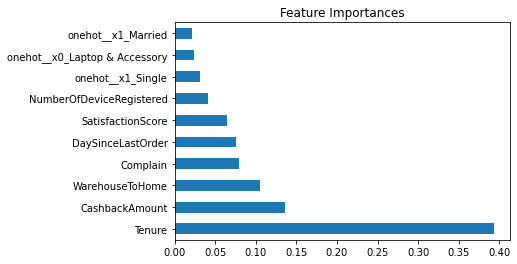

In [50]:
coef1 = pd.Series(best_model['model'].feature_importances_, transformer.get_feature_names()).sort_values(ascending = False).head(10)
coef1.plot(kind='barh', title='Feature Importances')
plt.show()

Terlihat bahwa ternyata untuk model Random Forest, fitur/kolom Tenure adalah yang paling penting, kemudian diikuti dengan WarehousetoHome, Complain, dan seterusnya.

## Conclusion & Recommendation

In [62]:
print('Classification Report Tuned RF : \n', report_tuned)

Classification Report Tuned RF : 
               precision    recall  f1-score   support

           0       0.96      0.97      0.96       571
           1       0.81      0.75      0.78       102

    accuracy                           0.93       673
   macro avg       0.88      0.86      0.87       673
weighted avg       0.93      0.93      0.93       673



Berdasarkan hasil classification report dari model kita, kita dapat menyimpulkan bahwa: 
1. Prediksi 97% dengan benar dari keseluruhan customer yang tidak churn (berdasarkan recall)
2. Prediksi 75% dengan benar dari keseluruhan customer yang churn(berdasarkan recall)
3. 96% prediksi benar dari keseluruhan prediksi customer yang tidak churn (precisionnya)
4. 81% prediksi benar dari keseluruhan prediksi customer yang churn (precisionnya)

Penelitian telah menemukan bahwa 5 kali lebih mahal untuk mendapatkan pelanggan baru daripada mempertahankan pelanggan yang sudah ada.(berdasarkan sumber dari https://id.strephonsays.com/cost-of-new-customer-and-vs-retaining-customer-1204, dan andaikan biaya mempertahankan pelanggan 10 USD, banyak pelanggan 200, misalkan 100 pelanggan tidak churn, dan 100 pelanggan Churn) maka hitungannya kurang lebih akan seperti ini:

Tanpa Model:
- Biaya mencari pelanggan baru = 5 x 10 = 50 USD
- Total Biaya => 100 x 50 = 5000 USD
- Biaya yang terbuang => 100 x 50 USD = 5000 USD (karena 100 orang Churn dan perlu mencari pelanggan baru)
- Jumlah penghematan => 0 USD

Dengan Model (hanya customer yang diprediksi oleh model Churn) :
- Total Biaya => (75 x 50 USD) + (3 x 50 USD) = 3750 USD + 150 USD = 3900 USD
- Biaya yang terbuang => 3 x 50 USD = 150 USD (berdasarkan recall 0)
- Jumlah penghematan => (97 x 50 USD) - (97 x 10USD) = 4850 - 970 = 3880 USD (yang dihitung hanya yang memang tidak Churn)

Berdasarkan contoh hitungan tersebut, terlihat bahwa dengan menggunakan model kita, maka perusahaan tersebut akan menghemat biaya yang cukup besar.

#### Recommendation

Hal-hal yang bisa dilakukan untuk mengembangkan project dan modelnya lebih baik lagi :
- Meningkatkan kualitas layanan untuk pelanggan baru sehingga mempermudah customer untuk membeli barang menggunakan ecommerce kita dibanding beli offline atau menggunakan ecommerce yang lain. 
- Menambahkan fitur2 atau kolom2 baru yang kemungkinan bisa berhubungan dengan kepuasan customer, seperti kota tempat tinggal(untuk mengetahui wilayah kota mana yang memiliki tingkat kepuasan yang rendah sehingga dapat dicari pokok permasalahan dan dievaluasi sumber pokok permasalahan di kota tersebut), metode pembayaran (apakah debit, cash), dll.
- Mencoba algorithm ML yang lain dan juga mencoba hyperparameter tuning kembali, coba gunakan teknik oversampling yang berbeda juga selain Random Over Sampling, seperti Under Sampling,SMOTENC,dll. 
- Menganalisa data-data yang model kita masih salah tebak untuk mengetahui alasannya dan karakteristiknya bagaimana.